<a href="https://colab.research.google.com/github/Pedro-Prestes/learning/blob/master/Talis_2018_professor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Talis 2018 - Análise de dados do ensino-aprendizagem - INEP

In [ ]:
# Análise dos dados educacionais - São dados do INEP disponibilizados por meio de API
from sklearn.tree import DecisionTreeClassifier,export_graphviz
from sklearn import metrics
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import datetime as dt
from sklearn.preprocessing import MinMaxScaler, StandardScaler, Normalizer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn import datasets
from sklearn import svm
%matplotlib inline
!pip3 install bokeh

In [ ]:
Talis2018 = pd.read_csv('/content/drive/My Drive/Microdados_Talis_2018/microdados_talis_2018.zip (Unzipped Files)/talis_br_2018_microdados_div_publica.zip (Unzipped Files)/TALIS 2018/DADOS/TALIS_BR_2018_MICRODADOS.zip (Unzipped Files)/BTGBRAT3.CSV')

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (363) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [ ]:
Talis2018.head()

,IDTEACH,IDSCHOOL,PISASCHOOLID,IDLANG,IDCNTRY,CNTRY,IDCNTRYR,IDCNTPOP,TT3G01,TT3G03,TT3G04,TT3G05,TT3G06A1,TT3G06A2,TT3G06B1,TT3G06B2,TT3G06C1,TT3G06C2,TT3G06D1,TT3G06D2,TT3G06E1,TT3G06E2,TT3G06F1,TT3G06F2,TT3G06G1,TT3G06G2,TT3G06H1,TT3G06H2,TT3G06I1,TT3G06I2,TT3G06J1,TT3G06J2,TT3G06K1,TT3G06K2,TT3G06L1,TT3G06L2,TT3G07A,TT3G07B,TT3G07C,TT3G07D,...,TRWGT95,TRWGT96,TRWGT97,TRWGT98,TRWGT99,TRWGT100,TCHAGEGR,T3STBEH,T3CLAIN,T3CLASM,T3COGAC,T3COLES,T3EFFPD,T3EXCH,T3PDBAR,T3DISC,T3PERUT,T3PDIV,T3PDPED,T3VALP,T3SATAT,T3JSENV,T3JSPRO,T3SECLS,T3SEINS,T3SEENG,T3SEFE,T3SOCUT,T3STAKE,T3TEAM,T3STUD,T3WELS,T3WLOAD,T3TPRA,T3COOP,T3JOBSA,T3SELF,T3DIVP,IEADATE,VERSION
0,300102,3001,NaN,61,76,BRA,6,BRA2,2,5.0,1.0,1977,1,4,1,4,1,4,1,4,1,4,1,4,1,4,2,2,1,4,1,4,1,4,1,4,2,3,3,3,...,134.28449,134.28449,134.28449,134.28449,402.85347,402.85347,6,8.58928,7.66768,8.96787,7.34918,5.85989,14.16165,6.00724,4.50098,7.43789,10.32842,7.81000,7.27686,9.78764,15.36643,10.35741,12.28156,11.34110,11.11023,10.36051,9.57594,12.63985,12.23308,11.65463,11.58203,7.49464,8.53337,6.94512,5.17032,11.60680,10.97262,6.80475,20190603,36
1,300103,3001,NaN,61,76,BRA,6,BRA2,1,5.0,1.0,1984,1,4,1,3,2,3,1,4,1,4,2,2,1,4,1,3,1,4,1,4,1,4,1,4,1,1,1,1,...,134.28449,134.28449,134.28449,134.28449,402.85347,402.85347,5,6.85940,15.03642,12.44259,13.69145,9.17791,12.94647,9.79492,10.39000,7.17677,5.41534,7.81681,5.84883,9.48142,15.36643,11.12534,11.13790,15.03457,15.17202,14.27796,A,12.63985,11.64515,11.65463,12.39866,6.68548,5.46520,15.30173,9.27809,11.38678,15.55611,A,20190603,36
2,300104,3001,NaN,61,76,BRA,6,BRA2,2,5.0,1.0,1981,1,3,1,3,1,3,1,3,1,2,2,1,1,2,1,3,1,1,1,3,1,3,1,2,3,2,3,1,...,44.76150,44.76150,44.76150,44.76150,134.28449,134.28449,6,7.89954,14.27859,12.10092,7.82748,8.69295,A,7.62207,6.24830,4.22744,9.60407,6.44287,8.73542,6.68496,15.36643,14.46560,14.41492,15.03457,15.17202,14.27796,14.03539,13.26486,14.89085,14.93322,15.85770,6.38395,5.31953,11.91572,7.74162,15.26168,15.55611,11.87039,20190603,36
3,300105,3001,NaN,61,76,BRA,6,BRA2,2,5.0,1.0,2016,1,4,1,3,1,3,1,3,2,3,2,3,1,3,1,2,2,3,1,3,2,2,2,2,1,1,1,1,...,134.28449,134.28449,134.28449,134.28449,402.85347,402.85347,5,8.87981,11.11579,9.52442,8.76256,5.56298,A,6.92740,10.38273,8.16345,5.41534,11.01888,8.28412,7.55407,13.49258,10.63040,14.00584,12.06258,11.98643,13.30323,A,13.26486,5.90682,8.37605,13.25733,7.49464,8.03359,9.57966,5.53062,12.77635,12.75549,5.69744,20190603,36
4,300106,3001,NaN,61,76,BRA,6,BRA2,1,6.0,7.0,2012,1,3,2,2,2,2,1,3,2,2,2,1,2,2,1,3,2,2,2,2,1,2,2,1,2,2,2,4,...,134.28449,134.28449,134.28449,134.28449,402.85347,402.85347,3,10.91130,11.73319,13.12808,7.43049,5.85989,A,11.67623,11.96768,12.55748,8.61024,10.00602,10.76520,12.58410,12.06758,11.12534,14.00584,8.36912,12.09284,10.36051,A,9.36990,10.37242,6.31692,14.14920,12.09139,7.32986,10.98444,8.44753,13.06617,10.19146,A,20190603,36


In [ ]:
Talis2018.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2447 entries, 0 to 2446
Columns: 397 entries, IDTEACH to VERSION
dtypes: float64(105), int64(14), object(278)
memory usage: 7.4+ MB


In [ ]:
Talis2018.dtypes

IDTEACH           int64
IDSCHOOL          int64
PISASCHOOLID    float64
IDLANG            int64
IDCNTRY           int64
                 ...   
T3JOBSA          object
T3SELF           object
T3DIVP           object
IEADATE           int64
VERSION           int64
Length: 397, dtype: object

In [ ]:
Talis2018.shape

(2447, 397)

In [ ]:
Talis2018['CNTRY'].value_counts()

BRA    2447
Name: CNTRY, dtype: int64

In [ ]:
Talis2018['IDTEACH'].value_counts()

303102    1
316813    1
315905    1
302409    1
306503    1
         ..
318116    1
305801    1
317804    1
318110    1
303104    1
Name: IDTEACH, Length: 2447, dtype: int64

In [ ]:
Talis2018_1 = Talis2018[['IDTEACH','TT3G01','TT3G03','TT3G04','TT3G06D1','TT3G06G1','TT3G06H1','TT3G06I1','TT3G06J1','TT3G06B2','TT3G06C2','TT3G06D2','TT3G19A1','TT3G19A2','TT3G19A3','TT3G20A','TT3G20B','TT3G20D','TT3G20E','TT3G21A','TT3G21B','TT3G22C','TT3G22D','TT3G22G','TT3G32A','TT3G32B','TT3G32C','TT3G32D','TT3G34A','TT3G34B','TT3G34D','TT3G34E','TT3G34H','TT3G34I','TT3G34J']]

In [ ]:
Talis2018_1.head()

,IDTEACH,TT3G01,TT3G03,TT3G04,TT3G06D1,TT3G06G1,TT3G06H1,TT3G06I1,TT3G06J1,TT3G06B2,TT3G06C2,TT3G06D2,TT3G19A1,TT3G19A2,TT3G19A3,TT3G20A,TT3G20B,TT3G20D,TT3G20E,TT3G21A,TT3G21B,TT3G22C,TT3G22D,TT3G22G,TT3G32A,TT3G32B,TT3G32C,TT3G32D,TT3G34A,TT3G34B,TT3G34D,TT3G34E,TT3G34H,TT3G34I,TT3G34J
0,300102,2,5.0,1.0,1,1,2,1,1,4,4,4,1,2,2,B,B,B,B,1,1,2,2,1,3,3,3,3,3,3,3,3,3,3,3
1,300103,1,5.0,1.0,1,1,1,1,1,3,3,4,2,1,2,2,2,1,1,2,1,2,2,2,3,3,3,3,4,4,4,4,4,4,4
2,300104,2,5.0,1.0,1,1,1,1,1,3,3,3,2,2,1,B,B,B,B,2,2,2,2,2,4,4,4,4,4,4,4,4,4,4,4
3,300105,2,5.0,1.0,1,1,1,2,1,3,3,3,2,2,1,B,B,B,B,2,2,2,2,2,2,2,2,2,4,4,3,3,3,3,2
4,300106,1,6.0,7.0,1,2,1,2,2,2,2,3,2,2,1,B,B,B,B,1,2,1,2,2,1,1,1,3,3,3,2,3,2,2,4


In [ ]:
print(Talis2018_1.shape)
print(Talis2018_1)

(2447, 35)
      IDTEACH  TT3G01  TT3G03  TT3G04  ... TT3G34E TT3G34H TT3G34I TT3G34J
0      300102       2     5.0     1.0  ...       3       3       3       3
1      300103       1     5.0     1.0  ...       4       4       4       4
2      300104       2     5.0     1.0  ...       4       4       4       4
3      300105       2     5.0     1.0  ...       3       3       3       2
4      300106       1     6.0     7.0  ...       3       2       2       4
...       ...     ...     ...     ...  ...     ...     ...     ...     ...
2442   319223       1     5.0     1.0  ...       3       3       3       3
2443   319224       1     5.0     1.0  ...       1       4       4       4
2444   319225       1     5.0     1.0  ...       4       4       4       4
2445   319226       1     5.0     1.0  ...       3       3       3       4
2446   319228       2     5.0     1.0  ...       2       2       2       3

[2447 rows x 35 columns]


In [ ]:
Talis2018_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2447 entries, 0 to 2446
Data columns (total 35 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   IDTEACH   2447 non-null   int64  
 1   TT3G01    2447 non-null   int64  
 2   TT3G03    2427 non-null   float64
 3   TT3G04    2427 non-null   float64
 4   TT3G06D1  2409 non-null   object 
 5   TT3G06G1  2413 non-null   object 
 6   TT3G06H1  2414 non-null   object 
 7   TT3G06I1  2410 non-null   object 
 8   TT3G06J1  2406 non-null   object 
 9   TT3G06B2  2361 non-null   object 
 10  TT3G06C2  2336 non-null   object 
 11  TT3G06D2  2364 non-null   object 
 12  TT3G19A1  2346 non-null   object 
 13  TT3G19A2  2347 non-null   object 
 14  TT3G19A3  2347 non-null   object 
 15  TT3G20A   2398 non-null   object 
 16  TT3G20B   2395 non-null   object 
 17  TT3G20D   2399 non-null   object 
 18  TT3G20E   2396 non-null   object 
 19  TT3G21A   2416 non-null   object 
 20  TT3G21B   2375 non-null   obje

In [ ]:
Talis2018_1.head()

,IDTEACH,TT3G01,TT3G03,TT3G04,TT3G06D1,TT3G06G1,TT3G06H1,TT3G06I1,TT3G06J1,TT3G06B2,TT3G06C2,TT3G06D2,TT3G19A1,TT3G19A2,TT3G19A3,TT3G20A,TT3G20B,TT3G20D,TT3G20E,TT3G21A,TT3G21B,TT3G22C,TT3G22D,TT3G22G,TT3G32A,TT3G32B,TT3G32C,TT3G32D,TT3G34A,TT3G34B,TT3G34D,TT3G34E,TT3G34H,TT3G34I,TT3G34J
0,300102,2,5.0,1.0,1,1,2,1,1,4,4,4,1,2,2,B,B,B,B,1,1,2,2,1,3,3,3,3,3,3,3,3,3,3,3
1,300103,1,5.0,1.0,1,1,1,1,1,3,3,4,2,1,2,2,2,1,1,2,1,2,2,2,3,3,3,3,4,4,4,4,4,4,4
2,300104,2,5.0,1.0,1,1,1,1,1,3,3,3,2,2,1,B,B,B,B,2,2,2,2,2,4,4,4,4,4,4,4,4,4,4,4
3,300105,2,5.0,1.0,1,1,1,2,1,3,3,3,2,2,1,B,B,B,B,2,2,2,2,2,2,2,2,2,4,4,3,3,3,3,2
4,300106,1,6.0,7.0,1,2,1,2,2,2,2,3,2,2,1,B,B,B,B,1,2,1,2,2,1,1,1,3,3,3,2,3,2,2,4


In [ ]:
Talis2018_1 = Talis2018_1.set_index('IDTEACH')

In [ ]:
Talis2018_1.isnull()

,TT3G01,TT3G03,TT3G04,TT3G06D1,TT3G06G1,TT3G06H1,TT3G06I1,TT3G06J1,TT3G06B2,TT3G06C2,TT3G06D2,TT3G19A1,TT3G19A2,TT3G19A3,TT3G20A,TT3G20B,TT3G20D,TT3G20E,TT3G21A,TT3G21B,TT3G22C,TT3G22D,TT3G22G,TT3G32A,TT3G32B,TT3G32C,TT3G32D,TT3G34A,TT3G34B,TT3G34D,TT3G34E,TT3G34H,TT3G34I,TT3G34J
IDTEACH,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
300102,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
300103,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
300104,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
300105,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
300106,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319223,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
319224,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
319225,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
Talis2018_1.dropna(inplace=True)

In [ ]:
Talis2018_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2047 entries, 300102 to 319228
Data columns (total 34 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   TT3G01    2047 non-null   int64  
 1   TT3G03    2047 non-null   float64
 2   TT3G04    2047 non-null   float64
 3   TT3G06D1  2047 non-null   object 
 4   TT3G06G1  2047 non-null   object 
 5   TT3G06H1  2047 non-null   object 
 6   TT3G06I1  2047 non-null   object 
 7   TT3G06J1  2047 non-null   object 
 8   TT3G06B2  2047 non-null   object 
 9   TT3G06C2  2047 non-null   object 
 10  TT3G06D2  2047 non-null   object 
 11  TT3G19A1  2047 non-null   object 
 12  TT3G19A2  2047 non-null   object 
 13  TT3G19A3  2047 non-null   object 
 14  TT3G20A   2047 non-null   object 
 15  TT3G20B   2047 non-null   object 
 16  TT3G20D   2047 non-null   object 
 17  TT3G20E   2047 non-null   object 
 18  TT3G21A   2047 non-null   object 
 19  TT3G21B   2047 non-null   object 
 20  TT3G22C   2047 non-null

In [ ]:
Talis2018_1.columns.values

array(['TT3G01', 'TT3G03', 'TT3G04', 'TT3G06D1', 'TT3G06G1', 'TT3G06H1',
       'TT3G06I1', 'TT3G06J1', 'TT3G06B2', 'TT3G06C2', 'TT3G06D2',
       'TT3G19A1', 'TT3G19A2', 'TT3G19A3', 'TT3G20A', 'TT3G20B',
       'TT3G20D', 'TT3G20E', 'TT3G21A', 'TT3G21B', 'TT3G22C', 'TT3G22D',
       'TT3G22G', 'TT3G32A', 'TT3G32B', 'TT3G32C', 'TT3G32D', 'TT3G34A',
       'TT3G34B', 'TT3G34D', 'TT3G34E', 'TT3G34H', 'TT3G34I', 'TT3G34J'],
      dtype=object)

In [ ]:
Talis2018_1.duplicated()

IDTEACH
300102    False
300103    False
300104    False
300105    False
300106    False
          ...  
319223    False
319224    False
319225    False
319226    False
319228    False
Length: 2047, dtype: bool

In [ ]:
Talis2018_1.dtypes

TT3G01        int64
TT3G03      float64
TT3G04      float64
TT3G06D1     object
TT3G06G1     object
TT3G06H1     object
TT3G06I1     object
TT3G06J1     object
TT3G06B2     object
TT3G06C2     object
TT3G06D2     object
TT3G19A1     object
TT3G19A2     object
TT3G19A3     object
TT3G20A      object
TT3G20B      object
TT3G20D      object
TT3G20E      object
TT3G21A      object
TT3G21B      object
TT3G22C      object
TT3G22D      object
TT3G22G      object
TT3G32A      object
TT3G32B      object
TT3G32C      object
TT3G32D      object
TT3G34A      object
TT3G34B      object
TT3G34D      object
TT3G34E      object
TT3G34H      object
TT3G34I      object
TT3G34J      object
dtype: object

In [ ]:
def coerce_df_columns_to_numeric(Talis2018_1, column_list):
    Talis2018_1[column_list] = Talis2018_1[column_list].apply(pd.to_numeric, errors='coerce')

In [ ]:
Talis2018_1.astype('category').T

IDTEACH,300102,300103,300104,300105,300106,300107,300201,300202,300204,300205,300206,300209,300210,300211,300212,300214,300301,300304,300306,300307,300309,300310,300312,300313,300401,300402,300404,300405,300409,300410,300414,300420,300421,300424,300501,300502,300503,300504,300505,300506,...,318804,318901,318909,318916,319002,319003,319004,319101,319102,319103,319104,319105,319106,319107,319108,319110,319202,319203,319204,319205,319206,319207,319208,319209,319210,319211,319212,319213,319214,319215,319217,319218,319220,319221,319222,319223,319224,319225,319226,319228
TT3G01,2,1,2,2,1,1,1,2,2,1,1,1,1,2,1,1,1,1,1,1,1,1,1,1,2,2,1,1,1,1,2,1,1,2,2,2,1,1,2,2,...,1,1,2,2,1,2,1,1,2,1,1,1,1,2,2,2,1,1,1,1,1,1,2,2,2,2,2,1,2,1,1,1,1,2,2,1,1,1,1,2
TT3G03,5,5,5,5,6,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,6,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,...,5,5,5,5,5,5,5,5,5,5,5,5,6,5,5,5,5,6,5,5,5,6,5,6,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5
TT3G04,1,1,1,1,7,2,1,1,1,4,1,1,2,1,2,1,1,1,1,1,4,5,1,1,1,2,1,1,1,2,1,1,2,1,4,1,1,7,1,1,...,1,1,2,1,1,1,1,1,5,1,1,1,1,1,4,1,4,1,1,2,2,1,4,1,1,1,1,1,1,1,2,1,2,2,1,1,1,1,1,1
TT3G06D1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1,1,2,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
TT3G06G1,1,1,1,1,2,1,1,1,1,1,1,1,2,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,...,1,2,1,2,1,1,1,1,1,2,2,1,1,1,1,1,1,1,1,2,1,1,1,1,1,1,1,1,2,1,1,1,1,2,2,1,1,1,1,1
TT3G06H1,2,1,1,1,1,2,1,1,1,2,1,2,2,1,1,1,1,1,1,2,1,1,1,1,1,1,2,1,2,2,2,2,2,1,1,1,1,2,1,1,...,1,1,1,1,1,2,2,1,1,1,1,2,2,2,1,1,1,1,2,2,1,1,2,2,1,2,1,1,1,2,1,2,1,2,1,1,1,1,1,1
TT3G06I1,1,1,1,2,2,1,1,1,1,1,1,1,2,1,1,1,1,1,1,1,1,1,1,1,2,1,1,2,2,1,1,2,2,1,1,1,1,1,2,1,...,1,1,2,2,2,2,1,2,1,2,1,2,2,1,1,1,1,2,1,2,1,1,1,2,1,1,1,1,2,1,1,1,1,2,1,1,1,1,1,1
TT3G06J1,1,1,1,1,2,1,1,1,1,1,1,1,2,2,2,1,1,1,1,1,1,1,1,1,2,1,1,2,1,1,1,2,2,1,1,1,1,1,2,1,...,1,1,1,2,1,2,1,1,1,1,1,2,1,1,1,1,1,1,1,2,2,2,1,2,1,1,1,1,2,2,1,1,1,1,2,1,1,1,1,1
TT3G06B2,4,3,3,3,2,4,4,4,3,3,3,3,3,2,3,4,3,3,4,4,3,4,3,4,3,3,4,4,2,4,4,3,3,3,3,3,3,4,3,3,...,3,3,3,2,3,1,3,3,3,3,4,3,3,4,3,4,4,3,3,4,3,2,3,3,4,3,4,3,2,2,4,4,3,4,4,4,4,4,4,4
TT3G06C2,4,3,3,3,2,4,4,4,3,3,3,3,3,2,3,3,3,3,4,4,3,4,3,4,3,3,4,4,3,4,4,3,3,3,3,3,3,4,3,3,...,3,3,3,3,3,1,3,3,3,3,4,3,3,4,3,4,4,3,3,4,2,2,4,3,3,3,4,3,2,2,4,4,3,3,4,4,4,4,4,4


In [ ]:
for col_name in Talis2018_1.columns:
    if(Talis2018_1[col_name].dtype == 'object'):
        Talis2018_1[col_name]= Talis2018_1[col_name].astype('category')
        Talis2018_1[col_name] = Talis2018_1[col_name].cat.codes

In [ ]:
Talis2018_1.dtypes

TT3G01        int64
TT3G03      float64
TT3G04      float64
TT3G06D1       int8
TT3G06G1       int8
TT3G06H1       int8
TT3G06I1       int8
TT3G06J1       int8
TT3G06B2       int8
TT3G06C2       int8
TT3G06D2       int8
TT3G19A1       int8
TT3G19A2       int8
TT3G19A3       int8
TT3G20A        int8
TT3G20B        int8
TT3G20D        int8
TT3G20E        int8
TT3G21A        int8
TT3G21B        int8
TT3G22C        int8
TT3G22D        int8
TT3G22G        int8
TT3G32A        int8
TT3G32B        int8
TT3G32C        int8
TT3G32D        int8
TT3G34A        int8
TT3G34B        int8
TT3G34D        int8
TT3G34E        int8
TT3G34H        int8
TT3G34I        int8
TT3G34J        int8
dtype: object

In [ ]:
Talis2018_1.columns.values

array(['TT3G01', 'TT3G03', 'TT3G04', 'TT3G06D1', 'TT3G06G1', 'TT3G06H1',
       'TT3G06I1', 'TT3G06J1', 'TT3G06B2', 'TT3G06C2', 'TT3G06D2',
       'TT3G19A1', 'TT3G19A2', 'TT3G19A3', 'TT3G20A', 'TT3G20B',
       'TT3G20D', 'TT3G20E', 'TT3G21A', 'TT3G21B', 'TT3G22C', 'TT3G22D',
       'TT3G22G', 'TT3G32A', 'TT3G32B', 'TT3G32C', 'TT3G32D', 'TT3G34A',
       'TT3G34B', 'TT3G34D', 'TT3G34E', 'TT3G34H', 'TT3G34I', 'TT3G34J'],
      dtype=object)

In [ ]:
## Para a nossa análise resolvemos pegar algumas variáveis separadas por contexto a serem cruzadas posteriormente para observar os graus de corrrelaciomentos.
###################################### conforme dicionário disponível analisaremos as variáveis ##########################################
################## Informações básicas e Qualificação #################
# ('IDTEACH')== Código do Professor)
# ('TT3G01') = sexo)
# ('TT3G03') = Nivel mais elevado de educação formal concluído) 
# ('TT3G04') = Primeiro curso de formação docente)
# ('TT3G06D1') = Prática em sala de aula (estágio ou práticas pedagógicas) em algumas ou todas as disciplinas que leciono); 
# ('TT3G06G1') = Ensino de habilidades intercurriculares (por exemplo, criatividade, pensamento crítico, resolução de problemas)  
# ('TT3G06H1') = Uso de TIC (Tecnologia de Informação e Comunicação) para o ensino  
# ('TT3G06I1') = Comportamento do aluno e gestão da sala de aula
# ('TT3G06J1') = Monitoramento do desenvolvimento e aprendizado dos alunos 
# ('TT3G06B2') = Pedagogia (didática) de algumas ou todas as disciplinas que leciono 
# ('TT3G06C2') = Pedagogia (didática) de maneira geral
# ('TT3G06D2') = Prática em sala de aula (estágio ou práticas pedagógicas) em algumas ou todas as disciplinas que leciono 
################### Desenvolvimento Profissional ########################
#### Você participou de alguma atividade de indução (integração)? ####
# ('TT3G19A1') = Sim, durante meu primeiro emprego
# ('TT3G19A2') = Sim, nesta escola
# ('TT3G19A3') = Não
#### Quando você começou a trabalhar nesta escola, as seguintes atividades fizeram parte de sua indução (integração)? ######
# ('TT3G20A') = Cursos/seminários presenciais
# ('TT3G20B') = Cursos/seminários on-line
# ('TT3G20D') = Reuniões agendadas com o diretor e/ou professores mais experientes  
# ('TT3G20E') = Supervisão pelo diretor e/ou professores mais experientes  
#### Você está atualmente envolvido em alguma atividade de orientação como parte de um arranjo formal nesta escola? ########
# ('TT3G21A') = Eu tenho, no momento, um orientador designado para me apoiar. 
# ('TT3G21B') = Eu atuo como um orientador designado para um ou mais professores.  
#### Durante os últimos 12 meses, você participou de alguma das seguintes atividades de desenvolvimento profissional? ######
# ('TT3G22C') = Conferências sobre educação onde professores e/ou pesquisadores apresentam resultados de suas pesquisas ou discutem assuntos educacionais  
# ('TT3G22D') = Programa de qualificação formal (por ex., especialização, mestrado, doutorado) 
# ('TT3G22G') = Observação entre pares e/ou auto-observação e treinamento, como parte de um arranjo formal da escola 
###################### Ensino de forma geral #########################
#### Considerando os professores desta escola, em que medida você concorda ou discorda das seguintes afirmações? #######
# ('TT3G32A') = A maioria dos professores nesta escola procura desenvolver novas ideias para o ensino e aprendizagem. 
# ('TT3G32B') = A maioria dos professores nesta escola é aberta a mudanças.  
# ('TT3G32C') = A maioria dos professores nesta escola busca novas maneiras de resolver problemas.  
# ('TT3G32D') = A maioria dos professores nesta escola apoia-se mutuamente na aplicação de novas ideias.  
#### Com relação ao seu ensino, em que medida você é capaz de fazer o seguinte? #####
# ('TT3G34A') = Fazer com que os alunos acreditem que eles podem ir bem nos trabalhos escolares  
# ('TT3G34B') = Ajudar os alunos a valorizar o aprendizado 
# ('TT3G34D') = Controlar comportamento perturbador em sala de aula 
# ('TT3G34E') = Motivar alunos que demonstram baixo interesse pelos trabalhos escolares 
# ('TT3G34H') = Fazer com que os alunos sigam as regras de sala de aula 
# ('TT3G34I') = Acalmar um aluno que interrompe muito ou faz muito barulho 
# ('TT3G34J') = Utilizar uma variedade de estratégias de avaliação 

Talis2018_1.corr(method='pearson')

,TT3G01,TT3G03,TT3G04,TT3G06D1,TT3G06G1,TT3G06H1,TT3G06I1,TT3G06J1,TT3G06B2,TT3G06C2,TT3G06D2,TT3G19A1,TT3G19A2,TT3G19A3,TT3G20A,TT3G20B,TT3G20D,TT3G20E,TT3G21A,TT3G21B,TT3G22C,TT3G22D,TT3G22G,TT3G32A,TT3G32B,TT3G32C,TT3G32D,TT3G34A,TT3G34B,TT3G34D,TT3G34E,TT3G34H,TT3G34I,TT3G34J
TT3G01,1.000000,0.039998,-0.069280,0.013091,0.017375,0.003746,0.006041,0.054943,-0.044339,-0.023508,0.012889,0.007877,-0.008533,-0.016493,0.010104,0.013463,0.006188,0.016839,0.019432,-0.064985,-0.020686,-0.047355,-0.041959,-0.114411,-0.080917,-0.092640,-0.066469,-0.045813,-0.040326,0.025630,-0.050656,-0.041457,-0.001788,-0.027491
TT3G03,0.039998,1.000000,-0.172076,-0.175053,-0.075875,-0.065402,-0.016621,-0.020869,-0.058531,-0.043121,-0.052159,-0.028993,-0.028950,0.008401,-0.018500,-0.040148,-0.026735,-0.029733,0.047567,-0.020270,-0.051011,-0.092995,-0.035871,-0.058035,-0.089477,-0.078564,-0.062146,-0.040122,-0.032340,-0.047112,-0.060947,-0.047364,-0.024440,-0.039172
TT3G04,-0.069280,-0.172076,1.000000,0.177053,0.108245,0.104266,0.034774,0.049887,0.060325,0.069031,0.045848,-0.009986,-0.007259,0.044361,-0.014563,-0.015392,-0.002202,-0.011650,-0.057347,0.027457,0.010686,0.023718,-0.026630,0.039045,0.036249,0.028665,0.061021,0.048854,0.036721,0.066076,0.047058,0.063145,0.025413,0.048317
TT3G06D1,0.013091,-0.175053,0.177053,1.000000,0.421110,0.351811,0.382171,0.418822,0.123491,0.127712,0.064171,0.124072,0.080970,0.076048,0.052738,0.065584,0.042391,0.039259,0.061178,0.126251,0.109920,0.077001,0.110465,0.026699,0.052011,0.036994,0.051551,0.029430,0.013219,0.066029,0.021522,0.024935,0.030064,0.040793
TT3G06G1,0.017375,-0.075875,0.108245,0.421110,1.000000,0.417541,0.471461,0.510773,0.029584,0.011857,0.032072,0.091158,0.125140,0.002693,0.088942,0.099111,0.088996,0.085575,0.111145,0.096478,0.117180,0.070118,0.105191,-0.051419,-0.048236,-0.048098,-0.028907,-0.055328,-0.081118,-0.007361,-0.086498,-0.027524,-0.042508,-0.032821
TT3G06H1,0.003746,-0.065402,0.104266,0.351811,0.417541,1.000000,0.397185,0.411732,-0.035772,-0.034312,-0.010829,0.094946,0.115378,-0.047438,0.094479,0.118343,0.088640,0.075652,0.116160,0.094163,0.148533,0.122226,0.125822,-0.048812,-0.030806,-0.054432,-0.038324,-0.028884,-0.048588,0.037135,-0.057606,-0.029190,-0.017099,-0.022776
TT3G06I1,0.006041,-0.016621,0.034774,0.382171,0.471461,0.397185,1.000000,0.635858,-0.034439,-0.049939,0.005780,0.117421,0.126772,-0.042332,0.097007,0.115415,0.095335,0.092197,0.130267,0.102685,0.119138,0.090252,0.128436,-0.023020,-0.035998,-0.038089,-0.032182,-0.063438,-0.093582,-0.055043,-0.111282,-0.074640,-0.065935,-0.031618
TT3G06J1,0.054943,-0.020869,0.049887,0.418822,0.510773,0.411732,0.635858,1.000000,-0.015396,-0.024230,0.007194,0.109117,0.114800,-0.007891,0.090616,0.099507,0.093077,0.087682,0.116282,0.111635,0.108069,0.071164,0.097034,-0.051717,-0.037848,-0.051550,-0.030289,-0.053783,-0.086177,0.014349,-0.106985,-0.027880,-0.027847,-0.034182
TT3G06B2,-0.044339,-0.058531,0.060325,0.123491,0.029584,-0.035772,-0.034439,-0.015396,1.000000,0.772424,0.604509,-0.007165,-0.026849,0.141287,-0.056926,-0.064298,-0.055279,-0.052374,0.032022,0.015523,-0.032019,-0.006073,-0.042277,0.143260,0.128206,0.125797,0.100024,0.219591,0.203904,0.192543,0.182828,0.171349,0.157003,0.220113
TT3G06C2,-0.023508,-0.043121,0.069031,0.127712,0.011857,-0.034312,-0.049939,-0.024230,0.772424,1.000000,0.588097,-0.039376,-0.027725,0.144555,-0.060818,-0.070429,-0.057224,-0.055683,0.012208,-0.002915,-0.019856,-0.033943,-0.073592,0.124226,0.131236,0.118638,0.101989,0.224338,0.206471,0.195321,0.190689,0.176656,0.167282,0.246787


In [ ]:
# Calcule a correlação  
correlacoes = Talis2018_1.corr('pearson')

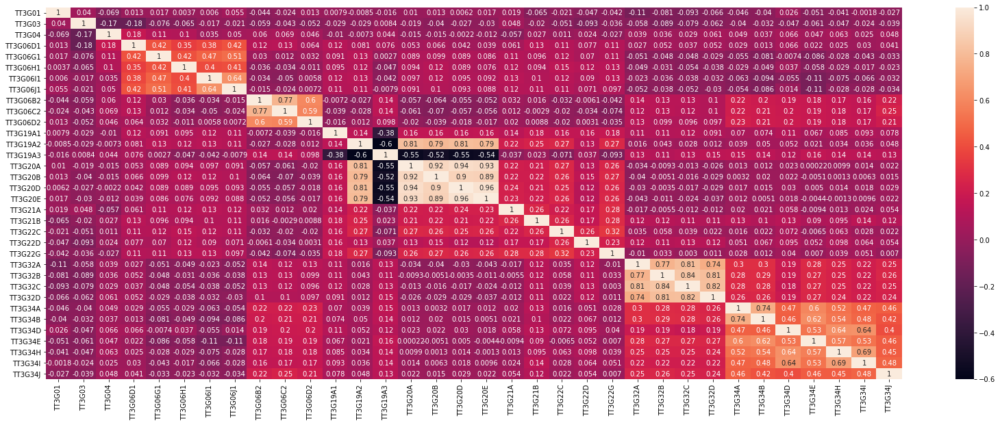

In [ ]:
# Usando o método heatmap do seaborn
plt.figure(figsize=(28, 10))
sns.heatmap(data=correlacoes, annot=True)

In [ ]:
# Calcule a correlação  
correlacoes = Talis2018_1.corr('spearman')

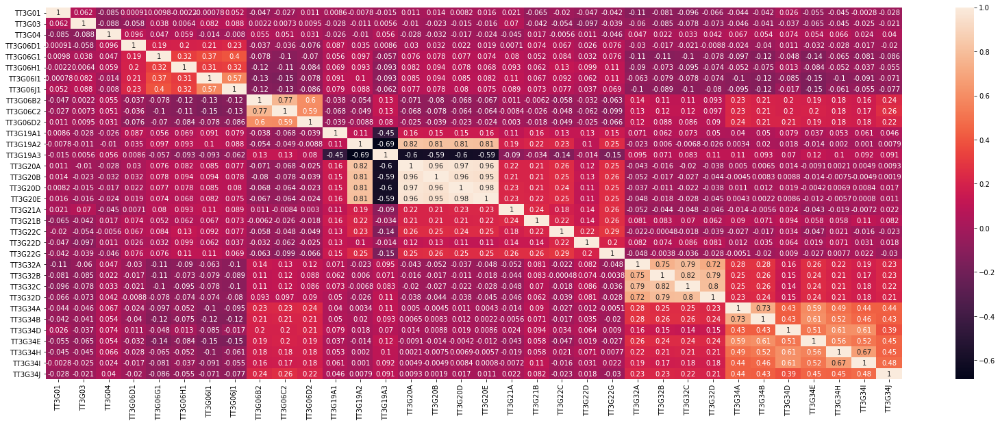

In [ ]:
# Usando o método heatmap do seaborn
plt.figure(figsize=(28, 10))
sns.heatmap(data=correlacoes, annot=True)

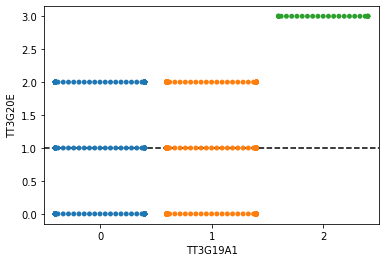

In [ ]:
sns.swarmplot(data=Talis2018_1, x='TT3G19A1', y='TT3G20E')
plt.axhline(1.0, color='black', linestyle='--')

In [ ]:
# Apenas uma amostragem por acionamento mecânico, contudo vale apena automatizar como demonstrado acima.
Talis2018_1['TT3G20E'].corr(Talis2018_1['TT3G19A1'])

0.15875535440344837

In [ ]:
X = Talis2018_1.drop(['TT3G20E'], axis=1)
y = Talis2018_1['TT3G19A1']

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif, mutual_info_classif
f_classif = SelectKBest(score_func=f_classif, k=4)
fit = f_classif.fit(X,y)
features = fit.transform(X)

# Visualizando as features:
print(features)

[[0. 1. 0. 1.]
 [1. 1. 0. 1.]
 [1. 0. 1. 1.]
 ...
 [1. 0. 1. 0.]
 [1. 0. 1. 1.]
 [1. 0. 1. 0.]]


/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/_univariate_selection.py:115: RuntimeWarning: divide by zero encountered in true_divide
  f = msb / msw


In [ ]:
cols = fit.get_support(indices=True)
Talis2018_1.iloc[:,cols]

,TT3G19A1,TT3G19A3,TT3G21A,TT3G21B
IDTEACH,,,,
300102,0,1,0,0
300103,1,1,1,0
300104,1,0,1,1
300105,1,0,1,1
300106,1,0,0,1
...,...,...,...,...
319223,0,1,1,1
319224,1,0,1,1
319225,1,0,1,1


In [ ]:
Talis2018_2 = Talis2018_1[['TT3G19A1','TT3G19A3','TT3G21A','TT3G21B']]

In [ ]:
correlacoes = Talis2018_2.corr('pearson')

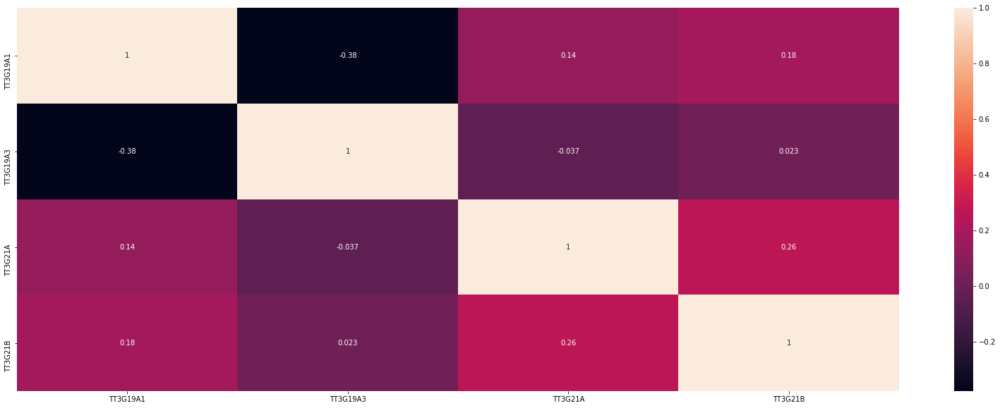

In [ ]:
# Usando o método heatmap do seaborn
plt.figure(figsize=(28, 10))
sns.heatmap(data=correlacoes, annot=True)

In [ ]:
#features categóricas ou variável alvo categórica
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [ ]:
# feature extraction
test = SelectKBest(chi2, k=4)

In [ ]:
fit = test.fit(X, y)

In [ ]:
fit.get_support(indices=True)

array([ 3, 11, 13, 19])

In [ ]:
features = fit.transform(X)

In [ ]:
# Visualizando as features:
print(features)

[[0. 0. 1. 1.]
 [0. 1. 1. 1.]
 [0. 1. 0. 1.]
 ...
 [0. 1. 0. 0.]
 [0. 1. 0. 1.]
 [0. 1. 0. 0.]]


In [ ]:
cols = fit.get_support(indices=True)
Talis2018_1.iloc[:, cols]

,TT3G06D1,TT3G19A1,TT3G19A3,TT3G21B
IDTEACH,,,,
300102,0,0,1,0
300103,0,1,1,0
300104,0,1,0,1
300105,0,1,0,1
300106,0,1,0,1
...,...,...,...,...
319223,0,0,1,1
319224,0,1,0,1
319225,0,1,0,1


In [ ]:
Talis2018_3 = Talis2018_1[['TT3G06D1','TT3G19A1','TT3G19A3','TT3G21B']]

In [ ]:
correlacoes = Talis2018_3.corr('pearson')

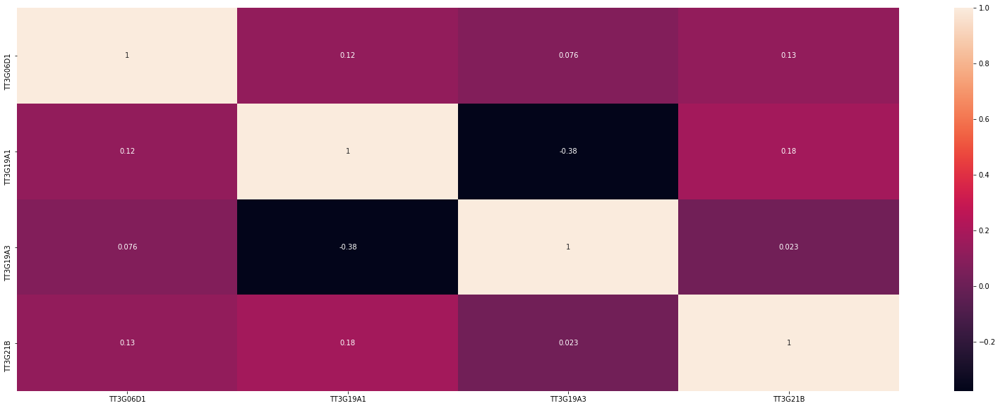

In [ ]:
# Usando o método heatmap do seaborn
plt.figure(figsize=(28, 10))
sns.heatmap(data=correlacoes, annot=True)

In [ ]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(max_iter=4000)
from sklearn.feature_selection import RFE
rfe = RFE(model, 4)
fit = rfe.fit(X, y)

In [ ]:
# Mostrando o número de features:
print ("Número de features: {}".format(fit.n_features_))  

Número de features: 4


In [ ]:
# Visualizando os índices:
cols = fit.get_support(indices=True)
Talis2018_1.iloc[:,cols]

,TT3G19A1,TT3G19A2,TT3G19A3,TT3G32A
IDTEACH,,,,
300102,0,1,1,2
300103,1,0,1,2
300104,1,1,0,3
300105,1,1,0,1
300106,1,1,0,0
...,...,...,...,...
319223,0,0,1,3
319224,1,1,0,2
319225,1,1,0,2


In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
# feature extraction
model = RandomForestClassifier(n_estimators=10)
model.fit(X, y)
RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
# Score de cada um dos atributos:
print(model.feature_importances_)

[0.00182566 0.00232542 0.00570387 0.00068617 0.00182011 0.00441325
 0.00241457 0.00157289 0.00459089 0.0039799  0.00398677 0.62506216
 0.04314161 0.13635256 0.01123194 0.00820057 0.02281712 0.01450781
 0.01559785 0.0097349  0.01319315 0.01029412 0.00450748 0.00852984
 0.00699395 0.00409451 0.0033342  0.00180791 0.0032009  0.0051393
 0.00322688 0.00524051 0.01047126]


In [ ]:
# Nome das colunas:
Talis2018_1

,TT3G01,TT3G03,TT3G04,TT3G06D1,TT3G06G1,TT3G06H1,TT3G06I1,TT3G06J1,TT3G06B2,TT3G06C2,TT3G06D2,TT3G19A1,TT3G19A2,TT3G19A3,TT3G20A,TT3G20B,TT3G20D,TT3G20E,TT3G21A,TT3G21B,TT3G22C,TT3G22D,TT3G22G,TT3G32A,TT3G32B,TT3G32C,TT3G32D,TT3G34A,TT3G34B,TT3G34D,TT3G34E,TT3G34H,TT3G34I,TT3G34J
IDTEACH,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
300102,2,5.0,1.0,0,0,1,0,0,3,3,3,0,1,1,2,2,2,2,0,0,1,1,0,2,2,2,2,2,2,2,2,2,2,2
300103,1,5.0,1.0,0,0,0,0,0,2,2,3,1,0,1,1,1,0,0,1,0,1,1,1,2,2,2,2,3,3,3,3,3,3,3
300104,2,5.0,1.0,0,0,0,0,0,2,2,2,1,1,0,2,2,2,2,1,1,1,1,1,3,3,3,3,3,3,3,3,3,3,3
300105,2,5.0,1.0,0,0,0,1,0,2,2,2,1,1,0,2,2,2,2,1,1,1,1,1,1,1,1,1,3,3,2,2,2,2,1
300106,1,6.0,7.0,0,1,0,1,1,1,1,2,1,1,0,2,2,2,2,0,1,0,1,1,0,0,0,2,2,2,1,2,1,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319223,1,5.0,1.0,0,0,0,0,0,3,3,3,0,0,1,0,1,0,0,1,1,0,1,1,3,3,3,3,3,3,2,2,2,2,2
319224,1,5.0,1.0,0,0,0,0,0,3,3,2,1,1,0,0,1,0,0,1,1,1,1,1,2,2,2,2,3,3,3,0,3,3,3
319225,1,5.0,1.0,0,0,0,0,0,3,3,3,1,1,0,2,2,2,2,1,1,0,1,1,2,2,2,2,3,3,2,3,3,3,3


In [ ]:
# Criando um Dataframe com as colunas e seus scores:
import pandas as pd
feature_importances = pd.DataFrame(model.feature_importances_,
                                   index = X.columns,
                                   columns=['importance']).sort_values('importance', ascending=False)
feature_importances

,importance
TT3G19A1,0.625062
TT3G19A3,0.136353
TT3G19A2,0.043142
TT3G20D,0.022817
TT3G21B,0.015598
TT3G21A,0.014508
TT3G22D,0.013193
TT3G20A,0.011232
TT3G34J,0.010471
TT3G22G,0.010294


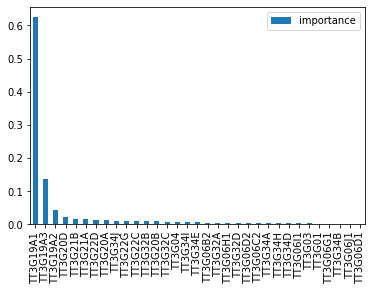

In [ ]:
# Visualizando as importâncias de forma gráfica:
feature_importances.plot(kind='bar')

In [ ]:
from sklearn.pipeline import Pipeline
clf = Pipeline([
  ('feature_selection', RFE(LogisticRegression(max_iter=4000),4)),
  ('classification', RandomForestClassifier())
])
clf.fit(X, y)

Pipeline(memory=None,
         steps=[('feature_selection',
                 RFE(estimator=LogisticRegression(C=1.0, class_weight=None,
                                                  dual=False,
                                                  fit_intercept=True,
                                                  intercept_scaling=1,
                                                  l1_ratio=None, max_iter=4000,
                                                  multi_class='auto',
                                                  n_jobs=None, penalty='l2',
                                                  random_state=None,
                                                  solver='lbfgs', tol=0.0001,
                                                  verbose=0, warm_start=False),
                     n_features_to_select=4, step=1, verbose=0)),
                ('classi...
                 RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                        cl

In [ ]:
clf.steps

[('feature_selection',
  RFE(estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                   fit_intercept=True, intercept_scaling=1,
                                   l1_ratio=None, max_iter=4000,
                                   multi_class='auto', n_jobs=None, penalty='l2',
                                   random_state=None, solver='lbfgs', tol=0.0001,
                                   verbose=0, warm_start=False),
      n_features_to_select=4, step=1, verbose=0)),
 ('classification',
  RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                         criterion='gini', max_depth=None, max_features='auto',
                         max_leaf_nodes=None, max_samples=None,
                         min_impurity_decrease=0.0, min_impurity_split=None,
                         min_samples_leaf=1, min_samples_split=2,
                         min_weight_fraction_leaf=0.0, n_estimators=100,
                         n_j

In [ ]:
Talis2018_1.describe()

,TT3G01,TT3G03,TT3G04,TT3G06D1,TT3G06G1,TT3G06H1,TT3G06I1,TT3G06J1,TT3G06B2,TT3G06C2,TT3G06D2,TT3G19A1,TT3G19A2,TT3G19A3,TT3G20A,TT3G20B,TT3G20D,TT3G20E,TT3G21A,TT3G21B,TT3G22C,TT3G22D,TT3G22G,TT3G32A,TT3G32B,TT3G32C,TT3G32D,TT3G34A,TT3G34B,TT3G34D,TT3G34E,TT3G34H,TT3G34I,TT3G34J
count,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000,2047.000000
mean,1.338544,5.042990,1.612115,0.070835,0.166097,0.358085,0.270151,0.215437,2.253053,2.200293,2.389350,0.839766,0.714216,0.434783,1.313141,1.435271,1.280410,1.311676,0.753786,0.941866,0.543234,0.723986,0.751343,2.119199,2.003908,2.059111,2.025892,2.461163,2.481192,2.318026,2.249145,2.391304,2.297509,2.301417
std,0.473330,0.418428,1.254906,0.308505,0.409758,0.509213,0.476016,0.445457,0.683887,0.694159,0.655337,0.398827,0.478173,0.519908,0.919081,0.794400,0.947045,0.920376,0.458390,0.281459,0.522197,0.473673,0.459734,0.754561,0.774713,0.746398,0.775866,0.599227,0.626487,0.669093,0.726854,0.651926,0.677749,0.671667
min,1.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,5.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2.000000,2.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
50%,1.000000,5.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2.000000,2.000000,1.000000,1.000000,0.000000,2.000000,2.000000,2.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000
75%,2.000000,5.000000,2.000000,0.000000,0.000000,1.000000,1.000000,0.000000,3.000000,3.000000,3.000000,1.000000,1.000000,1.000000,2.000000,2.000000,2.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
max,2.000000,7.000000,7.000000,3.000000,3.000000,3.000000,3.000000,3.000000,5.000000,5.000000,5.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000


In [ ]:
# Árvore de decisão será o próximo passo de nossa análise, 
# contudo vale apena deixar claro que esta técnica está propência
# a embaralhar os resultados dos testes em relação ao resultado de treinos permitindo o overfitting, e também é um pouco instável.

# Dividindo os dados em treino e teste:
X_train, X_test, y_train, y_test = train_test_split(Talis2018_1.drop('TT3G06B2',axis=1),Talis2018_1['TT3G06D2'],test_size=0.3)

In [ ]:
# Verificando as formas dos dados:
X_train.shape,X_test.shape

((1432, 33), (615, 33))

In [ ]:
# Instânciando o objeto classificador:
clf = DecisionTreeClassifier()

In [ ]:
# Treinando o modelo de arvore de decisão:
clf = clf.fit(X_train,y_train)

In [ ]:
# Verificando as features mais importantes para o modelo treinado:
clf.feature_importances_

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.02680875, 0.        , 0.        , 0.        , 0.96616494,
       0.00702631, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        ])

In [ ]:
for feature, importances_ in zip(Talis2018_1.columns,clf.feature_importances_):
    print("{}:{}".format(feature, importances_))

# Confirmando a melhor correlação (TT3G06B2) para (TT3G06D2).
# Saída:

TT3G01:0.0
TT3G03:0.0
TT3G04:0.0
TT3G06D1:0.0
TT3G06G1:0.0
TT3G06H1:0.026808752482025355
TT3G06I1:0.0
TT3G06J1:0.0
TT3G06B2:0.0
TT3G06C2:0.9661649354020266
TT3G06D2:0.007026312115947888
TT3G19A1:0.0
TT3G19A2:0.0
TT3G19A3:0.0
TT3G20A:0.0
TT3G20B:0.0
TT3G20D:0.0
TT3G20E:0.0
TT3G21A:0.0
TT3G21B:0.0
TT3G22C:0.0
TT3G22D:0.0
TT3G22G:0.0
TT3G32A:0.0
TT3G32B:0.0
TT3G32C:0.0
TT3G32D:0.0
TT3G34A:0.0
TT3G34B:0.0
TT3G34D:0.0
TT3G34E:0.0
TT3G34H:0.0
TT3G34I:0.0


In [ ]:
resultado = clf.predict(X_test)
resultado
# O código acima nos da a seguinte saída:

array([3, 2, 3, 3, 3, 3, 2, 2, 2, 3, 2, 3, 2, 2, 3, 2, 1, 2, 3, 2, 2, 2,
       1, 2, 3, 3, 2, 3, 2, 2, 3, 2, 2, 2, 2, 3, 2, 2, 3, 1, 2, 2, 2, 3,
       2, 3, 2, 1, 3, 2, 2, 1, 2, 2, 2, 3, 2, 3, 2, 2, 3, 1, 3, 3, 2, 3,
       3, 3, 2, 2, 3, 4, 3, 2, 2, 3, 2, 2, 3, 2, 3, 2, 3, 1, 1, 3, 2, 2,
       3, 2, 3, 3, 3, 2, 3, 3, 2, 3, 2, 2, 2, 2, 3, 3, 2, 1, 3, 3, 3, 3,
       2, 3, 3, 2, 2, 2, 2, 2, 1, 3, 3, 3, 2, 3, 1, 2, 3, 2, 2, 2, 2, 3,
       2, 3, 2, 1, 3, 2, 2, 3, 3, 3, 3, 3, 3, 1, 3, 1, 3, 2, 2, 3, 2, 2,
       2, 2, 3, 2, 3, 2, 3, 3, 3, 3, 3, 3, 2, 3, 2, 3, 2, 2, 3, 0, 3, 2,
       2, 2, 2, 3, 2, 3, 2, 3, 2, 2, 3, 3, 3, 3, 1, 2, 3, 2, 1, 2, 2, 2,
       0, 3, 3, 3, 2, 2, 2, 3, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 3, 2, 3, 2,
       3, 2, 3, 3, 3, 3, 3, 2, 1, 3, 2, 2, 2, 2, 2, 3, 3, 3, 3, 2, 2, 1,
       3, 2, 3, 3, 3, 3, 2, 2, 1, 2, 1, 3, 2, 2, 3, 2, 2, 2, 3, 2, 3, 2,
       2, 5, 1, 2, 2, 3, 3, 2, 3, 3, 1, 1, 2, 2, 3, 2, 3, 2, 2, 3, 3, 3,
       3, 3, 3, 3, 3, 2, 3, 3, 1, 2, 2, 2, 3, 1, 3,

In [ ]:
from sklearn import metrics
print(metrics.classification_report(y_test,resultado))

# Resultado do classification_report:

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       1.00      1.00      1.00        52
           2       1.00      1.00      1.00       277
           3       1.00      1.00      1.00       280
           4       1.00      1.00      1.00         2
           5       1.00      1.00      1.00         2

    accuracy                           1.00       615
   macro avg       1.00      1.00      1.00       615
weighted avg       1.00      1.00      1.00       615



In [ ]:
# Renderizando a árvore de forma gráfica:
!pip3 install ipywidgets
!pip3 install graphviz
!pip3 install pydot
import pydot

In [ ]:
import pydot
import graphviz

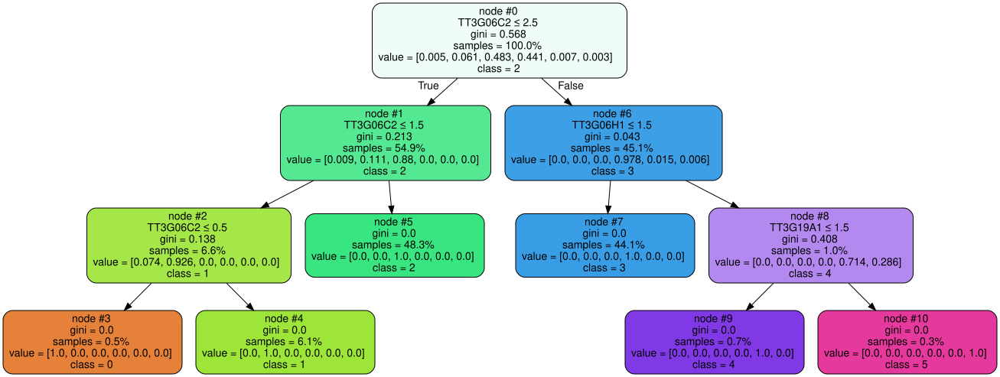

In [ ]:
dot_data = export_graphviz( 
         clf, 
         out_file=None,
         feature_names=Talis2018_1.drop('TT3G06D2',axis=1).columns,
         class_names=['0','1', '2','3','4', '5', '6'],  
         filled=True, rounded=True,
         proportion=True,
         node_ids=True,
         rotate=False,
         label='all',
         special_characters=True
        )  
graph = graphviz.Source(dot_data)  
graph

In [ ]:
# Renderizando a árvore de forma interativa:
from ipywidgets import interactive
from IPython.display import SVG,display
from graphviz import Source

# feature matrix
X,y = Talis2018_1.drop('TT3G06D2',axis=1),Talis2018_1['TT3G06D2']

# feature labels
features_label = Talis2018_1.drop('TT3G06D2',axis=1).columns

# class label
class_label = ['0','1', '2','3','4']


def plot_tree(crit, split, depth, min_samples_split, min_samples_leaf=0.2):
    estimator = DecisionTreeClassifier(
           random_state = 0 
          ,criterion = crit
          ,splitter = split
          ,max_depth = depth
          ,min_samples_split=min_samples_split
          ,min_samples_leaf=min_samples_leaf
    )
    estimator.fit(X, y)
    graph = Source(export_graphviz(estimator
      , out_file=None
      , feature_names=features_label
      , class_names=class_label
      , impurity=True
      , filled = True))
    display(SVG(graph.pipe(format='svg')))
    return estimator

inter=interactive(plot_tree 
   , crit = ["gini", "entropy"]
   , split = ["best", "random"]
   , depth=[1,2,3,4,5,10,20,30]
   , min_samples_split=(1,5)
   , min_samples_leaf=(1,5))

display(inter)

interactive(children=(Dropdown(description='crit', options=('gini', 'entropy'), value='gini'), Dropdown(descri…

/usr/local/lib/python3.6/dist-packages/mlxtend/plotting/decision_regions.py:244: MatplotlibDeprecationWarning: Passing unsupported keyword arguments to axis() will raise a TypeError in 3.3.
  ax.axis(xmin=xx.min(), xmax=xx.max(), y_min=yy.min(), y_max=yy.max())


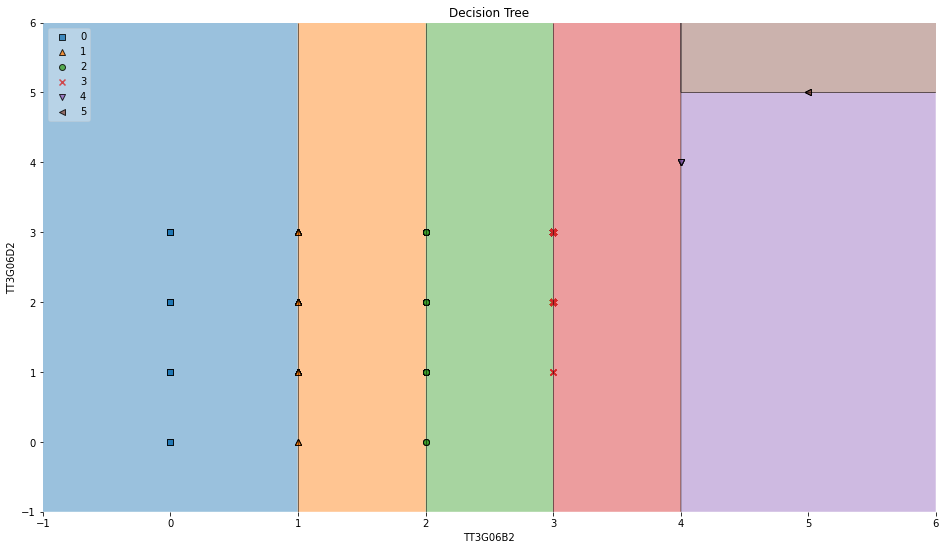

In [ ]:
# Visualizando as fronteiras criadas pela arvore:
from mlxtend.plotting import plot_decision_regions
import matplotlib.pyplot as plt

def visualize_fronteiras(msamples_split,max_depth):
    X = Talis2018_1[['TT3G06B2','TT3G06D2']].values
    y = Talis2018_1.TT3G06B2.values
    clf = DecisionTreeClassifier(min_samples_split=msamples_split,max_depth=max_depth)
    tree = clf.fit(X, y)

    plt.figure(figsize=(16,9))
    plot_decision_regions(X, y, clf=tree, legend=2)

    plt.xlabel('TT3G06B2')
    plt.ylabel('TT3G06D2')
    plt.title('Decision Tree')
    plt.show()

# Chamando a função criada anteriormente:

visualize_fronteiras(10,max_depth=8)

In [ ]:
# Navegando na estrutura da arvore de decisão:
estimator = DecisionTreeClassifier(max_depth=3,min_samples_split=2,min_samples_leaf=2)
estimator.fit(X, y)
DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=3,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')
n_nodes = estimator.tree_.node_count
children_left = estimator.tree_.children_left
children_right = estimator.tree_.children_right
feature = estimator.tree_.feature
threshold = estimator.tree_.threshold

print("Número de nós: {}".format(n_nodes))

Número de nós: 15


In [ ]:
node_depth = np.zeros(shape=n_nodes, dtype=np.int64)
is_leaves = np.zeros(shape=n_nodes, dtype=bool)
stack = [(0, -1)]
while len(stack) > 0:
    node_id, parent_depth = stack.pop()
    node_depth[node_id] = parent_depth + 1

    if (children_left[node_id] != children_right[node_id]):
        stack.append((children_left[node_id], parent_depth + 1))
        stack.append((children_right[node_id], parent_depth + 1))
    else:
        is_leaves[node_id] = True

print("\nA arvore binária tem %s nós e a seguinte estrutura: \n"
      % n_nodes)
for i in range(n_nodes):
    if is_leaves[i]:
        print("%snó=%s (nó folha)." % (node_depth[i] * "\t", i))
    else:
        print("%snó=%s (nó teste): vai para o nó %s se o valor do atributo %s <= %s \n se não, vai para o "
              "nó %s."
              % (node_depth[i] * "\t",
                 i,
                 children_left[i],
                 Talis2018_1.columns[feature[i]],
                 threshold[i],
                 children_right[i],
                 ))


A arvore binária tem 15 nós e a seguinte estrutura: 

nó=0 (nó teste): vai para o nó 1 se o valor do atributo TT3G06B2 <= 2.5 
 se não, vai para o nó 8.
	nó=1 (nó teste): vai para o nó 2 se o valor do atributo TT3G06B2 <= 1.5 
 se não, vai para o nó 5.
		nó=2 (nó teste): vai para o nó 3 se o valor do atributo TT3G06C2 <= 2.5 
 se não, vai para o nó 4.
			nó=3 (nó folha).
			nó=4 (nó folha).
		nó=5 (nó teste): vai para o nó 6 se o valor do atributo TT3G06C2 <= 2.5 
 se não, vai para o nó 7.
			nó=6 (nó folha).
			nó=7 (nó folha).
	nó=8 (nó teste): vai para o nó 9 se o valor do atributo TT3G06B2 <= 3.5 
 se não, vai para o nó 12.
		nó=9 (nó teste): vai para o nó 10 se o valor do atributo TT3G06C2 <= 2.5 
 se não, vai para o nó 11.
			nó=10 (nó folha).
			nó=11 (nó folha).
		nó=12 (nó teste): vai para o nó 13 se o valor do atributo TT3G06D1 <= 2.5 
 se não, vai para o nó 14.
			nó=13 (nó folha).
			nó=14 (nó folha).


In [ ]:
def extrai_regras(sample_id):
    node_indicator = estimator.decision_path(X)

    leave_id = estimator.apply(X)

    #sample_id = sample
    node_index = node_indicator.indices[node_indicator.indptr[sample_id]:
                                        node_indicator.indptr[sample_id + 1]]

    print('\nFeatures usadas para predizer a amostra %s' % (sample_id))

    for f,v in zip(Talis2018_1.columns,X.iloc[sample_id].values):
        print('%s = %s'%(f,v))

    print('\n')      
    for node_id in node_index:
        if leave_id[sample_id] == node_id:
            continue

        if (X.iloc[sample_id, feature[node_id]] <= threshold[node_id]):
            threshold_sign = "<="
        else:
            threshold_sign = ">"

        print("id do nó de decisão %s : (atributo %s com valor = %s %s %s)"
              % (node_id,
                 Talis2018_1.columns[feature[node_id]],
                 X.iloc[sample_id, feature[node_id]],
                 threshold_sign,
                 threshold[node_id]))
        
    pred =estimator.predict(X.iloc[sample_id].values.reshape(1, -1))
    print(pred) 
    print("\tClasse => %s" %pred)

In [ ]:
extrai_regras(2)


Features usadas para predizer a amostra 2
TT3G01 = 2.0
TT3G03 = 5.0
TT3G04 = 1.0
TT3G06D1 = 0.0
TT3G06G1 = 0.0
TT3G06H1 = 0.0
TT3G06I1 = 0.0
TT3G06J1 = 0.0
TT3G06B2 = 2.0
TT3G06C2 = 2.0
TT3G06D2 = 1.0
TT3G19A1 = 1.0
TT3G19A2 = 0.0
TT3G19A3 = 2.0
TT3G20A = 2.0
TT3G20B = 2.0
TT3G20D = 2.0
TT3G20E = 1.0
TT3G21A = 1.0
TT3G21B = 1.0
TT3G22C = 1.0
TT3G22D = 1.0
TT3G22G = 3.0
TT3G32A = 3.0
TT3G32B = 3.0
TT3G32C = 3.0
TT3G32D = 3.0
TT3G34A = 3.0
TT3G34B = 3.0
TT3G34D = 3.0
TT3G34E = 3.0
TT3G34H = 3.0
TT3G34I = 3.0


id do nó de decisão 0 : (atributo TT3G06B2 com valor = 2 <= 2.5)
id do nó de decisão 1 : (atributo TT3G06B2 com valor = 2 > 1.5)
id do nó de decisão 5 : (atributo TT3G06C2 com valor = 2 <= 2.5)
[2]
	Classe => [2]


In [ ]:
extrai_regras(7)


Features usadas para predizer a amostra 7
TT3G01 = 2.0
TT3G03 = 5.0
TT3G04 = 1.0
TT3G06D1 = 0.0
TT3G06G1 = 0.0
TT3G06H1 = 0.0
TT3G06I1 = 0.0
TT3G06J1 = 0.0
TT3G06B2 = 3.0
TT3G06C2 = 3.0
TT3G06D2 = 1.0
TT3G19A1 = 1.0
TT3G19A2 = 0.0
TT3G19A3 = 1.0
TT3G20A = 1.0
TT3G20B = 1.0
TT3G20D = 0.0
TT3G20E = 1.0
TT3G21A = 1.0
TT3G21B = 0.0
TT3G22C = 0.0
TT3G22D = 1.0
TT3G22G = 2.0
TT3G32A = 2.0
TT3G32B = 2.0
TT3G32C = 2.0
TT3G32D = 3.0
TT3G34A = 3.0
TT3G34B = 2.0
TT3G34D = 3.0
TT3G34E = 2.0
TT3G34H = 2.0
TT3G34I = 3.0


id do nó de decisão 0 : (atributo TT3G06B2 com valor = 3 > 2.5)
id do nó de decisão 8 : (atributo TT3G06B2 com valor = 3 <= 3.5)
id do nó de decisão 9 : (atributo TT3G06C2 com valor = 3 > 2.5)
[3]
	Classe => [3]


In [ ]:
# instalando o pandas profiling
!pip3 install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     / 34.0MB 1.2MB/s
     |████████████████████████████████| 71kB 2.1MB/s 
     |████████████████████████████████| 61kB 5.5MB/s 
     |████████████████████████████████| 604kB 18.2MB/s 
     |████████████████████████████████| 3.1MB 29.4MB/s 
     |████████████████████████████████| 71kB 7.3MB/s 
     |████████████████████████████████| 296kB 50.7MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-2.8.0-py2.py3-none-any.whl size=259932 sha256=158bbb16b395847a71172846d84de693f05d73fb9db8b83ce48b09e0aabff53d
  Stored in directory: /tmp/pip-ephem-wheel-cache-1ztwuz9p/wheels/56/c2/dd/8d945b0443c35df7d5f62fa9e9ae105a2d8b286302b92e0109
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp36-none-any.whl size=27084 sha256=a2417667a3351a85f719dd6b211375ccfaa93d5e7ce93de0f7f08b4b5e0f2d69
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
  Created wheel for imagehash: filename=ImageHash-4.1.0-py2.py3-none-any.whl size=2919

In [ ]:
# import o ProfileReport
from pandas_profiling import ProfileReport

In [ ]:
# executando o profile
profile = ProfileReport(Talis2018_1, title='Relatório - Pandas Profiling', html={'style':{'full_width':True}})

In [ ]:
profile

In [ ]:
# salvando o relatório no disco
profile.to_file(output_file="Relatorio01.html")

In [ ]:
#Interpretando o valor de ρ

    #0.9 a 1 positivo ou negativo indica uma correlação muito forte.
    #0.7 a 0.9 positivo ou negativo indica uma correlação forte.
    #0.5 a 0.7 positivo ou negativo indica uma correlação moderada.
    #0.3 a 0.5 positivo ou negativo indica uma correlação fraca.
    #0 a 0.3 positivo ou negativo indica uma correlação desprezível.